In [1]:
import numpy as np
import os
import glob
import matplotlib.pyplot as plt
import pickle as pkl
import skimage
import yaml

import sys
sys.path.append('../cytof')

from classes import CytofImageTiff
from utils import save_multi_channel_img
from hyperion_preprocess import cytof_read_data_roi

## Parameters

In [21]:
class options:
    def __init__(self):
        self.filename = '/archive/DPDS/Xiao_lab/shared/shidan/hyperion/The Single-Cell Pathology Landscape of Breast Cancer/OMEandSingleCellMasks/OMEnMasks/ome/ome/BaselTMA_SP43_25.8kx22ky_10500x6500_8_20170928_114_115_X4Y8_262_a0_full.tiff'
        self.outdir  = "../test_out/tiffs/single_roi"
        self.slide   = "BaselTMA_SP43_25.8kx22ky"
        self.roi     = "114_115_X4Y8_262"
        self.label_marker_file = "../test_data/roi_tiff/markers_labels.txt"
        # the parameter to define special channel(s)
        self.channel_dict = {
            'nuclei': ['DNA1(Ir191)', 'DNA2(Ir193)'],
            'membrane': ['Vimentin(Sm149)', 'c-erbB-2 - Her2(Eu151)', 'pan Cytokeratin-Keratin Epithelial(Lu175)', 
                         'CD44(Gd160)','Fibronectin(Nd142)'], 
        }
        self.keep_origs    = True
        self.use_membrane    = True
        self.cell_radius     = 5
        self.normalize_qs    = [75, 99]
        self.quality_control_thres = 50

params = options()

## 1) Read and preprocess data

In [3]:
# read cytof_img
cytof_img = cytof_read_data_roi(params.filename, slide=params.slide, roi=params.roi, iltype="dhw")

In [4]:
# quality control or make saving directory for the ROI
cytof_img.quality_control(params.quality_control_thres)
if cytof_img.keep:
# if cytof_img.image.shape[0] < params.quality_control_thres or cytof_img.image.shape[1] < quality_control_thres:
#     print("At least one dimension of the image {}-{} is smaller than {}, exclude from analyzing"\
#           .format(cytof_img.slide, cytof_img.roi, quality_control_thres))
# else:
    # output directory for the roi
    outdir = os.path.join(params.outdir, params.slide, params.roi)
    print("Saving to {}".format(outdir))
    if not os.path.exists(outdir):
        os.makedirs(outdir)
        
    dir_channelimg = os.path.join(outdir, "channel_images")
    if not os.path.exists(dir_channelimg):
        os.makedirs(dir_channelimg)
        
    dir_feature = os.path.join(outdir, "feature")
    if not os.path.exists(dir_feature):
        os.makedirs(dir_feature)

Saving to ../test_out/tiffs/single_roi/BaselTMA_SP43_25.8kx22ky/114_115_X4Y8_262


In [6]:
# set channel names (requires an external file with channel names)

labels_markers = yaml.load(open(params.label_marker_file, "rb"), Loader=yaml.Loader)
cytof_img.set_channels(markers=labels_markers["markers"], labels=labels_markers["labels"])

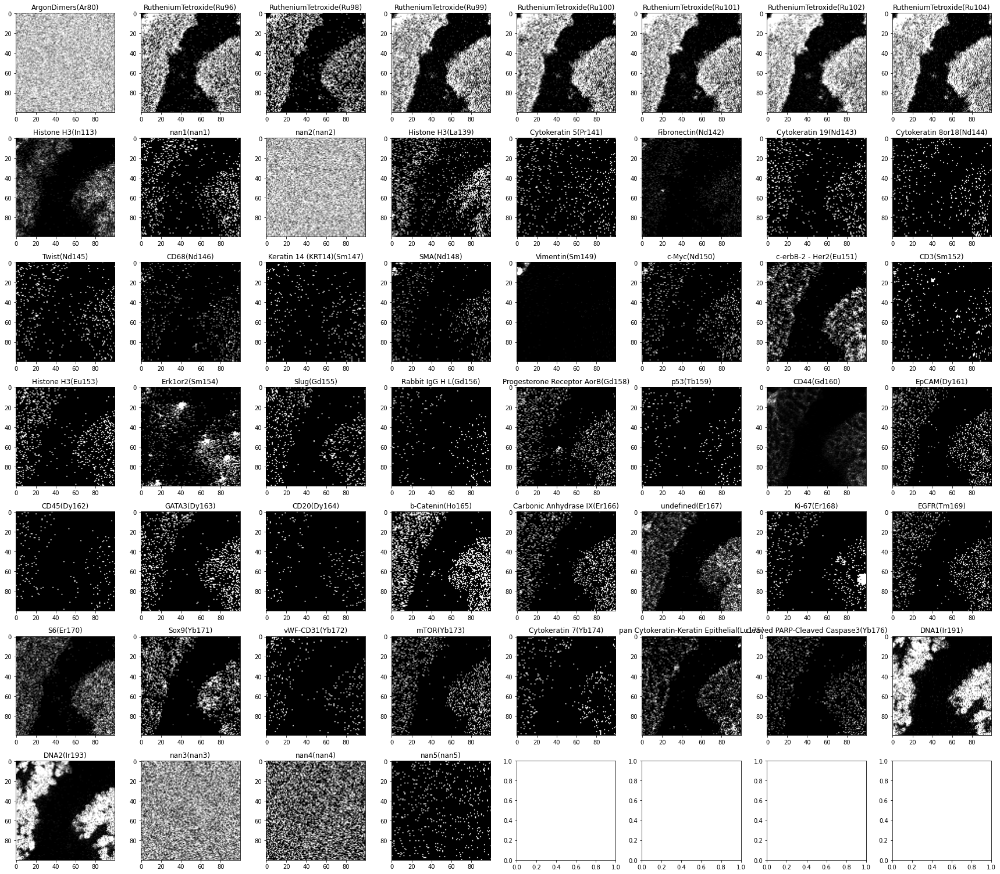

In [7]:
# get a glance of all channels
cytof_img.check_channels(channels=None, xlim=[0,100], ylim=[0,100], ncols=8, vis_q=0.9, colorbar=False)

In [10]:
# (optional) save channel images
cytof_img.save_channel_images(dir_channelimg)
cytof_img.save_channel_images(dir_channelimg, ext=".tiff")

In [11]:
f_info = open(os.path.join(outdir, 'readme.txt'), 'w')
f_info.write("Original markers: ")
f_info.write('\n{}'.format(", ".join(cytof_img.markers)))
f_info.write("\nOriginal channels: ")
f_info.write('\n{}'.format(", ".join(cytof_img.channels)))

987

## 2) Handle special channels
- Remove bad channels
- Define special channels

(782, 803, 47) 47 47 47


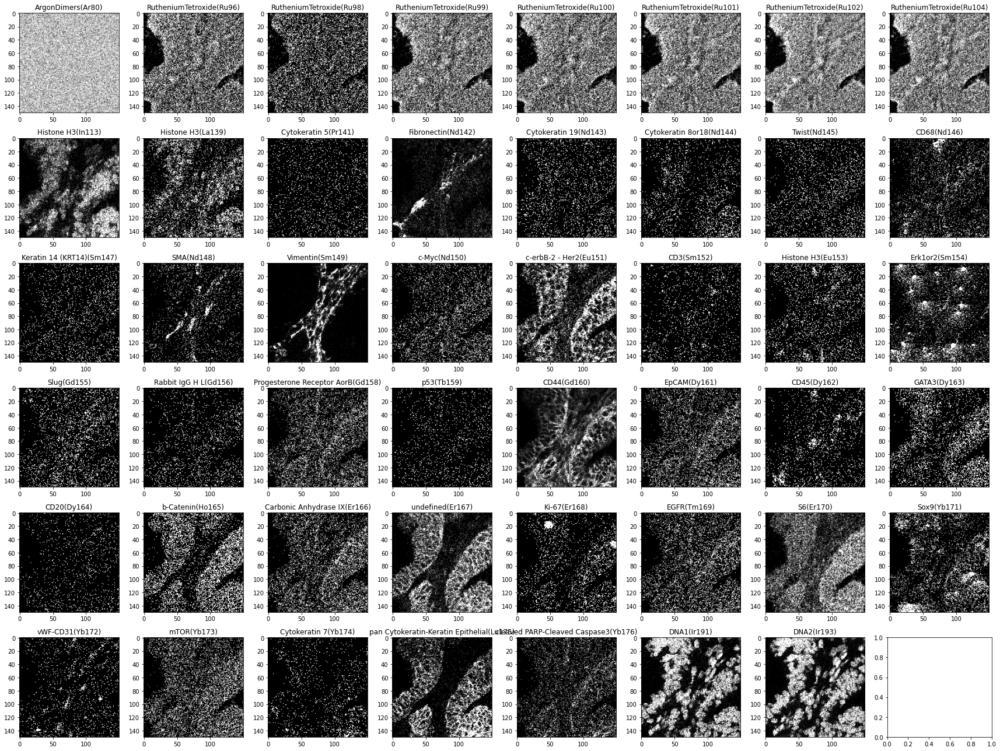

In [13]:
# remove unwanted channels (and check visualization)
channels_remove = ['nan1(nan1)', 'nan2(nan2)', 'nan3(nan3)', 'nan4(nan4)', 'nan5(nan5)']
setattr(params, "channels_remove", channels_remove)
cytof_img.remove_special_channels(params.channels_remove)

print(cytof_img.image.shape, len(cytof_img.markers), len(cytof_img.channels), len(cytof_img.labels))
assert(cytof_img.image.shape[-1] == len(cytof_img.markers) == len(cytof_img.channels) == len(cytof_img.labels))
cytof_img.check_channels(channels=None, xlim=[50,200], ylim=[50,200], ncols=8, vis_q=0.9, colorbar=False)

../cytof/classes.py:200: UserWarning: Visualizing more than 3 channels the same time results in deteriorated visualization.                 It is not recommended!
  warnings.warn(


Visualizing channels: Vimentin(Sm149), DNA1(Ir191), c-erbB-2 - Her2(Eu151), pan Cytokeratin-Keratin Epithelial(Lu175), Histone H3(In113), CD44(Gd160), Fibronectin(Nd142)
Visualizing... 
Vimentin(Sm149) in red
DNA1(Ir191) in green
c-erbB-2 - Her2(Eu151) in blue
pan Cytokeratin-Keratin Epithelial(Lu175) in cyan
Histone H3(In113) in magenta
CD44(Gd160) in yellow
Fibronectin(Nd142) in white



(-0.5, 299.5, 281.5, -0.5)

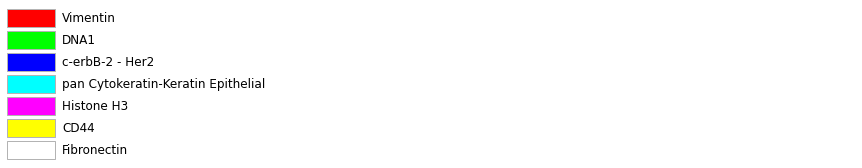

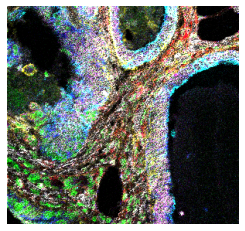

In [14]:
# (optional) visualize selected channels in pseudoRGB and save
## using channel names
vis_channel_names = ['Vimentin(Sm149)','DNA1(Ir191)','c-erbB-2 - Her2(Eu151)',
                     'pan Cytokeratin-Keratin Epithelial(Lu175)','Histone H3(In113)', 'CD44(Gd160)',
                    'Fibronectin(Nd142)']

pseudoRGB, quantiles, color_pool, fig_color_tb = cytof_img.visualize_channels(channel_names=vis_channel_names, 
                                                                              visualize=False)
fig, ax = plt.subplots(1,1)
# ax.imshow(pseudoRGB[0:300, 600:900,:])
ax.imshow(pseudoRGB[500:800, 0:300, :])
plt.axis('off')


In [24]:
channels_ = cytof_img.channels[:]
# define special channels (if desired)
channels_rm = cytof_img.define_special_channels(params.channel_dict)
# remove unwanted channels (if desired)
if not params.keep_origs: # if not keeping original channels
    cytof_img.remove_special_channels(channels_rm)

print("\nList of channels before defining special channel(s): \n{}".format(', '.join(channels_)))
print("\nUpdated list of channels after defining special channel(s): \n{}".format(', '.join(cytof_img.channels)))

Defining channel 'nuclei' by summing up channels: DNA1(Ir191), DNA2(Ir193).
(782, 803, 47)
(782, 803, 48)
Defining channel 'membrane' by summing up channels: Vimentin(Sm149), c-erbB-2 - Her2(Eu151), pan Cytokeratin-Keratin Epithelial(Lu175), CD44(Gd160), Fibronectin(Nd142).
(782, 803, 48)
(782, 803, 49)

List of channels before defining special channel(s): 
ArgonDimers(Ar80), RutheniumTetroxide(Ru96), RutheniumTetroxide(Ru98), RutheniumTetroxide(Ru99), RutheniumTetroxide(Ru100), RutheniumTetroxide(Ru101), RutheniumTetroxide(Ru102), RutheniumTetroxide(Ru104), Histone H3(In113), Histone H3(La139), Cytokeratin 5(Pr141), Fibronectin(Nd142), Cytokeratin 19(Nd143), Cytokeratin 8or18(Nd144), Twist(Nd145), CD68(Nd146), Keratin 14 (KRT14)(Sm147), SMA(Nd148), Vimentin(Sm149), c-Myc(Nd150), c-erbB-2 - Her2(Eu151), CD3(Sm152), Histone H3(Eu153), Erk1or2(Sm154), Slug(Gd155), Rabbit IgG H L(Gd156), Progesterone Receptor AorB(Gd158), p53(Tb159), CD44(Gd160), EpCAM(Dy161), CD45(Dy162), GATA3(Dy163), C

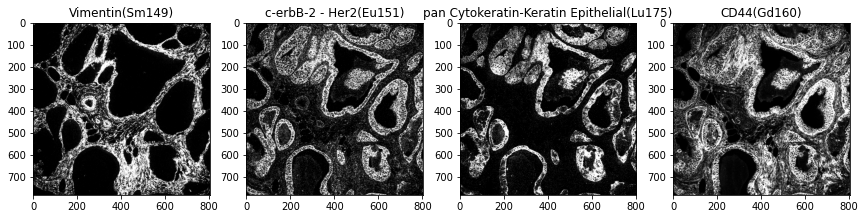

In [25]:
cytof_img.check_channels(channels=['Vimentin(Sm149)',
  'c-erbB-2 - Her2(Eu151)',
  'pan Cytokeratin-Keratin Epithelial(Lu175)',
  'CD44(Gd160)'], xlim=None, ylim=None, ncols=8, vis_q=0.9, colorbar=False)

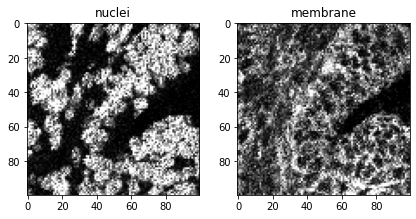

In [27]:
cytof_img.check_channels(channels=["nuclei", "membrane"], xlim=[100,200], ylim=[100,200], ncols=8, vis_q=0.9, colorbar=False)

Visualizing channels: nuclei, membrane
Visualizing... 
nuclei in red
membrane in green



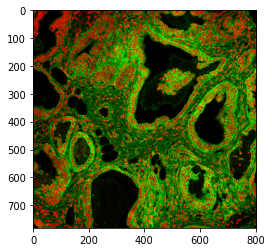

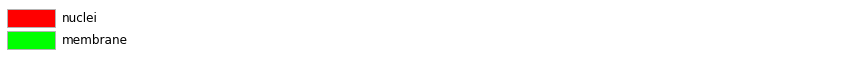

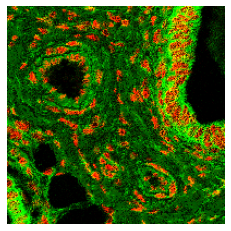

In [28]:
vis_channels_RGB = ['nuclei','membrane']#,'Histone H3(In113)']
pseudoRGB, quantiles, color_pool, fig_color_tb = cytof_img.visualize_channels(channel_names=vis_channels_RGB, 
                                                                              visualize=True)

fig, ax = plt.subplots(1,1)
ax.imshow(pseudoRGB[300:500, 200:400,:])
plt.axis('off')

save_multi_channel_img(skimage.img_as_ubyte(pseudoRGB[300:500, 200:400 :]), 
                        os.path.join(dir_channelimg, 
                                     "channels_{}.png".format('_'.join(vis_channels_RGB))))

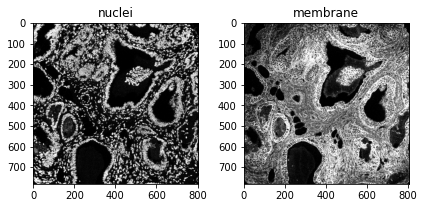

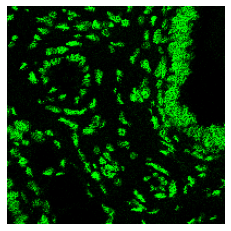

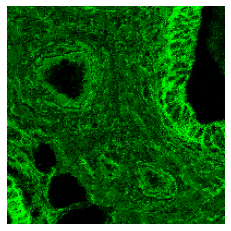

In [32]:
# (optional) check channels: get a glance of each added channel image
# one channel at a time
vis_channels = [k for (k, itm) in params.channel_dict.items() if len(itm)>0] #['nuclei', 'membrane']

# in grayscale
cytof_img.check_channels(channels=vis_channels)

# visualize in color image (green)
color = "green"
for channel_name in vis_channels:
    vis_im = cytof_img.visualize_single_channel(channel_name=channel_name, color=color)
    fig, ax = plt.subplots(1,1)
    ax.imshow(vis_im[300:500, 200:400, :])
    plt.axis('off')

    _channel_ids = [cytof_img.channels.index(_) for _ in vis_channel_names]
    save_multi_channel_img(
        skimage.img_as_ubyte(vis_im[300:500, 200:400, :]), 
        os.path.join(dir_channelimg, "channel_{}_in_{}.png".format(channel_name, color)))

In [33]:
# from hyperion_segmentation import visualize_segmentation

# def visualize_seg(self, segtype="cell", seg=None, show=False):
#     assert segtype in ["nuclei", "cell"]
#     # nuclei in red, membrane in green
#     if "membrane" in self.channels:
#         channel_ids = [self.channels.index(_) for _ in ["nuclei", "membrane"]]
#     else:
#         channel_ids = [self.channels.index("nuclei"), 0]
#     if seg is None:
#         if segtype == "cell":
#             seg = self.cell_seg
#             '''# membrane in red, nuclei in green
#             channel_ids = [self.channels.index(_) for _ in ["membrane", "nuclei"]]'''
#         else:
#             seg = self.nuclei_seg

#     marked_image = visualize_segmentation(self.image, self.channels, seg, channel_ids=channel_ids, show=show)
#     print("{} boundary marked by white".format(segtype))
#     return marked_image

In [33]:
# (optional) save newly added channel images
cytof_img.save_channel_images(dir_channelimg, channels=vis_channels)

## 3) Nuclei and cells segmentation


Not using membrane, 3
3684 nuclei
Visualizing... 
nuclei in red
membrane in green

nuclei boundary marked by white
Visualizing... 
nuclei in red
membrane in green

cell boundary marked by white


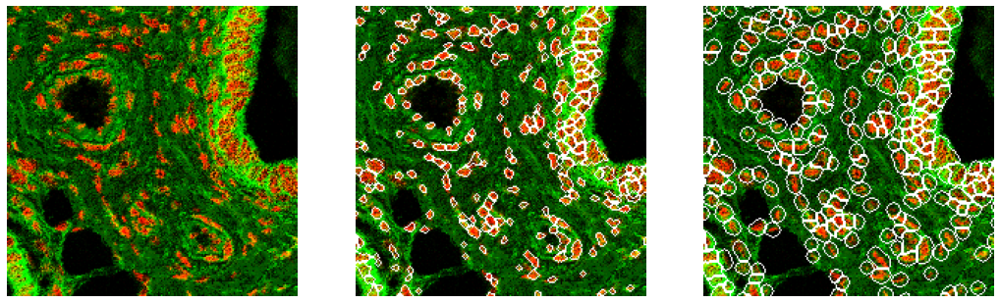


Not using membrane, 5
3684 nuclei
Visualizing... 
nuclei in red
membrane in green

nuclei boundary marked by white
Visualizing... 
nuclei in red
membrane in green

cell boundary marked by white


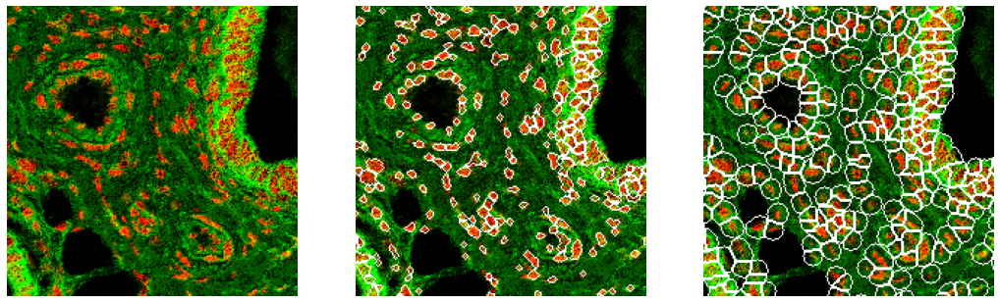


Not using membrane, 10
3684 nuclei
Visualizing... 
nuclei in red
membrane in green

nuclei boundary marked by white
Visualizing... 
nuclei in red
membrane in green

cell boundary marked by white


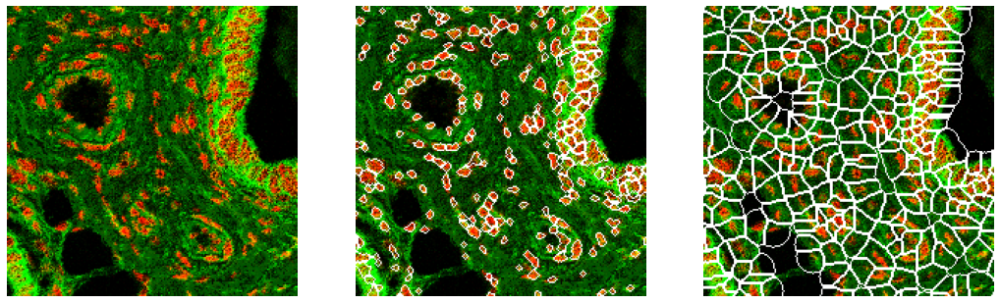


Using membrane, 3
3684 nuclei
Visualizing... 
nuclei in red
membrane in green

nuclei boundary marked by white
Visualizing... 
nuclei in red
membrane in green

cell boundary marked by white


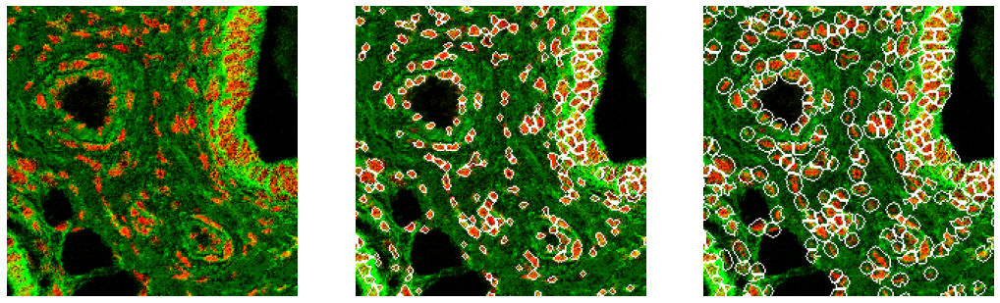


Using membrane, 5
3684 nuclei
Visualizing... 
nuclei in red
membrane in green

nuclei boundary marked by white
Visualizing... 
nuclei in red
membrane in green

cell boundary marked by white


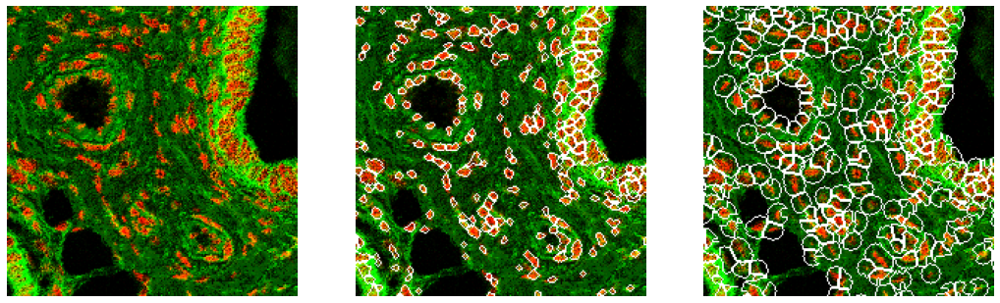


Using membrane, 10
3684 nuclei
Visualizing... 
nuclei in red
membrane in green

nuclei boundary marked by white
Visualizing... 
nuclei in red
membrane in green

cell boundary marked by white


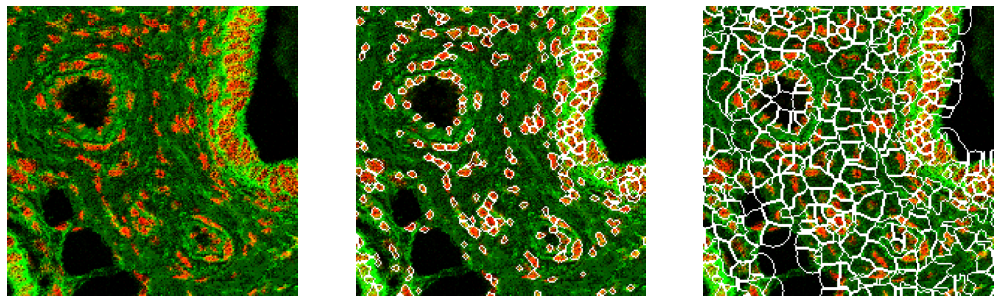

In [36]:
nuclei_segs, cell_segs = {}, {}
marked_img_nuclei, marked_img_cell = {}, {}

for use_membrane in [False, True]:
    for radius in [3, 5, 10]:
        if use_membrane:
            print("\nUsing membrane, {}".format(radius))
            key = "mem-"
        else:
            print("\nNot using membrane, {}".format(radius))
            key = "nomem-"
        nuclei_seg, cell_seg = cytof_img.get_seg(use_membrane=use_membrane, radius=radius)
        print("{} nuclei".format(len(np.unique(nuclei_seg))))
        key += str(radius)
        nuclei_segs[key] = nuclei_seg
        cell_segs[key]   = cell_seg
        
#         marked_img_nuclei[key]  = visualize_seg(cytof_img, seg=nuclei_seg)
#         marked_img_cell[key]    = visualize_seg(cytof_img, seg=cell_seg)
        
        marked_img_nuclei[key]  = cytof_img.visualize_seg(segtype="nuclei")
        marked_img_cell[key]    = cytof_img.visualize_seg(segtype="cell")
        
        fig, axs = plt.subplots(1,3, figsize=(18,6))
        # fig, axs = plt.subplots(1,4, figsize=(24,6))
        axs[0].imshow(pseudoRGB[300:500,200:400])
        axs[1].imshow(marked_img_nuclei[key][300:500,200:400])
        axs[2].imshow(marked_img_cell[key][300:500,200:400])
        for ax in axs:
            ax.axis("off")
        plt.savefig(os.path.join(dir_channelimg, "seg_{}.png".format(key)))
        plt.show()

In [37]:
# (Optional) TODO: visualize segmentation results on single colored visualization

## 4) Feature extraction

In [38]:
cytof_img.extract_features(params.filename)

cytof_img.df_feature.head()

100%|███████████████████████████████████████████████████████████| 3683/3683 [16:58<00:00,  3.62it/s]


,filename,id,coordinate_x,coordinate_y,ArgonDimers(Ar80)_nuclei_sum,RutheniumTetroxide(Ru96)_nuclei_sum,RutheniumTetroxide(Ru98)_nuclei_sum,RutheniumTetroxide(Ru99)_nuclei_sum,RutheniumTetroxide(Ru100)_nuclei_sum,RutheniumTetroxide(Ru101)_nuclei_sum,...,convex_area_cell,eccentricity_cell,extent_cell,filled_area_cell,major_axis_length_cell,minor_axis_length_cell,orientation_cell,perimeter_cell,solidity_cell,pa_ratio_cell
0,/archive/DPDS/Xiao_lab/shared/shidan/hyperion/...,2,25.985915,1.859155,47146.753906,320.692993,77.342995,545.292969,494.584015,682.886047,...,133,0.988393,0.786667,118,33.354752,5.067262,-1.521599,62.656854,0.887218,33.270181
1,/archive/DPDS/Xiao_lab/shared/shidan/hyperion/...,3,49.695652,1.347826,15057.241211,141.794006,38.588997,216.773010,194.177994,266.567017,...,95,0.919840,0.814815,88,17.512633,6.870092,1.527061,42.071068,0.926316,20.113349
2,/archive/DPDS/Xiao_lab/shared/shidan/hyperion/...,4,101.272727,0.727273,7124.183105,46.642998,9.424000,83.255997,59.362999,98.563988,...,43,0.979625,0.933333,42,16.234396,3.260417,1.570294,29.621320,0.976744,20.891015
3,/archive/DPDS/Xiao_lab/shared/shidan/hyperion/...,5,122.065990,3.233503,131088.312500,479.401001,147.464005,982.089966,928.190063,1218.049927,...,272,0.957543,0.631016,236,35.453707,10.220966,1.393916,80.142136,0.867647,27.215093
4,/archive/DPDS/Xiao_lab/shared/shidan/hyperion/...,6,140.347826,1.652174,15449.005859,69.094002,26.087002,118.137001,129.055008,176.171997,...,47,0.704821,0.656250,42,9.062735,6.428972,-0.932915,23.035534,0.893617,12.634186


In [39]:
# (optional) save extracted feature
cytof_img.df_feature.to_csv(os.path.join(dir_feature, "feature_summary.csv"), index=False)

#### Check feature distribution

dict_keys(['nuclei_morphology', 'cell_morphology', 'cell_sum', 'cell_ave', 'nuclei_sum', 'nuclei_ave'])
ArgonDimers(Ar80)_cell_sum


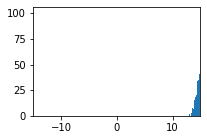

RutheniumTetroxide(Ru96)_cell_sum


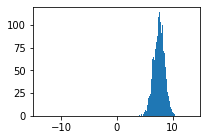

RutheniumTetroxide(Ru98)_cell_sum


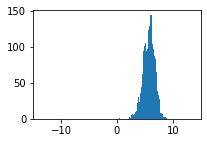

RutheniumTetroxide(Ru99)_cell_sum


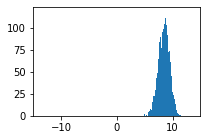

RutheniumTetroxide(Ru100)_cell_sum


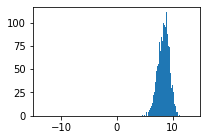

RutheniumTetroxide(Ru101)_cell_sum


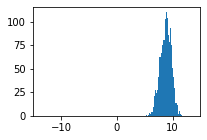

RutheniumTetroxide(Ru102)_cell_sum


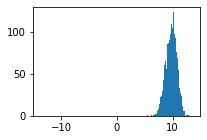

RutheniumTetroxide(Ru104)_cell_sum


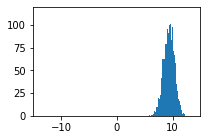

Histone H3(In113)_cell_sum


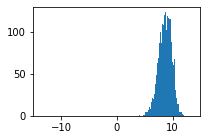

Histone H3(La139)_cell_sum


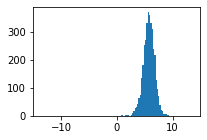

Cytokeratin 5(Pr141)_cell_sum


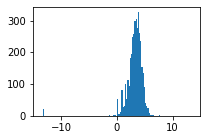

Fibronectin(Nd142)_cell_sum


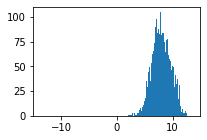

Cytokeratin 19(Nd143)_cell_sum


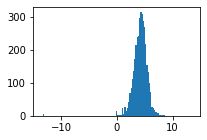

Cytokeratin 8or18(Nd144)_cell_sum


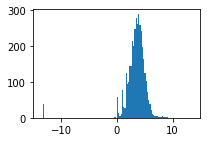

Twist(Nd145)_cell_sum


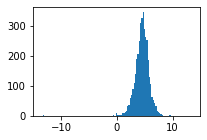

CD68(Nd146)_cell_sum


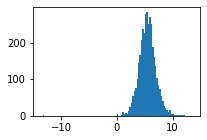

Keratin 14 (KRT14)(Sm147)_cell_sum


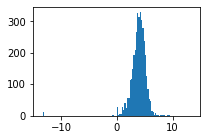

SMA(Nd148)_cell_sum


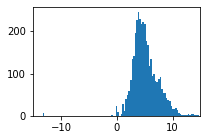

Vimentin(Sm149)_cell_sum


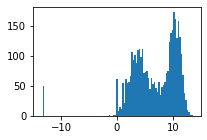

c-Myc(Nd150)_cell_sum


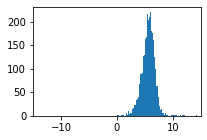

c-erbB-2 - Her2(Eu151)_cell_sum


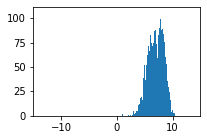

CD3(Sm152)_cell_sum


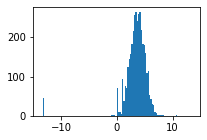

Histone H3(Eu153)_cell_sum


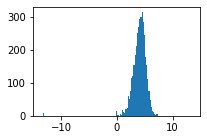

Erk1or2(Sm154)_cell_sum


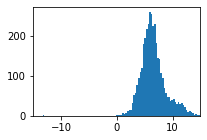

Slug(Gd155)_cell_sum


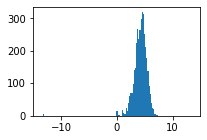

Rabbit IgG H L(Gd156)_cell_sum


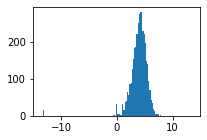

Progesterone Receptor AorB(Gd158)_cell_sum


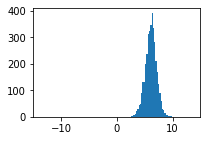

p53(Tb159)_cell_sum


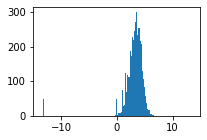

CD44(Gd160)_cell_sum


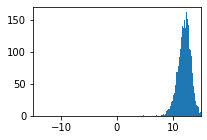

EpCAM(Dy161)_cell_sum


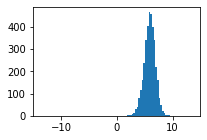

CD45(Dy162)_cell_sum


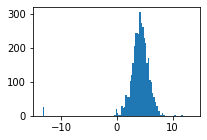

GATA3(Dy163)_cell_sum


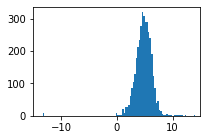

CD20(Dy164)_cell_sum


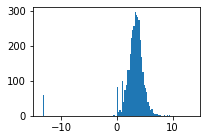

b-Catenin(Ho165)_cell_sum


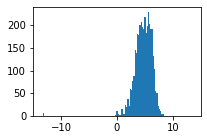

Carbonic Anhydrase IX(Er166)_cell_sum


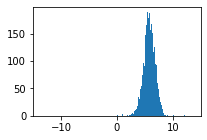

undefined(Er167)_cell_sum


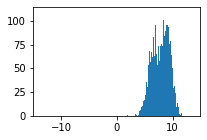

Ki-67(Er168)_cell_sum


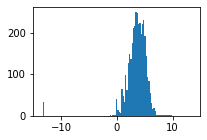

EGFR(Tm169)_cell_sum


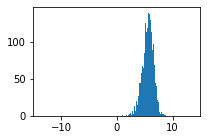

S6(Er170)_cell_sum


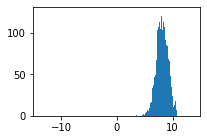

Sox9(Yb171)_cell_sum


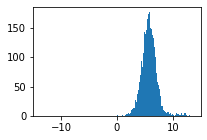

vWF-CD31(Yb172)_cell_sum


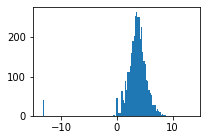

mTOR(Yb173)_cell_sum


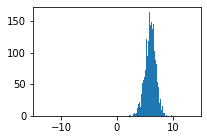

Cytokeratin 7(Yb174)_cell_sum


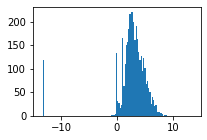

pan Cytokeratin-Keratin Epithelial(Lu175)_cell_sum


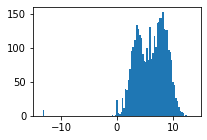

cleaved PARP-Cleaved Caspase3(Yb176)_cell_sum


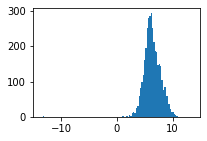

DNA1(Ir191)_cell_sum


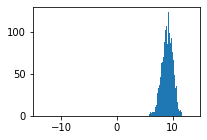

DNA2(Ir193)_cell_sum


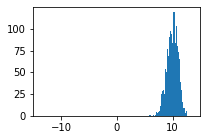

In [41]:
from hyperion_analysis import check_feature_distribution
# print the keys of extracted features (feature subsets)
print(cytof_img.features.keys())
check_feature_distribution(feature_summary_df=cytof_img.df_feature, features=cytof_img.features['cell_sum'])